In [1]:
#%matplotlib notebook
import sys
import os

# Standard modules used through the notebook 
import numpy as np
import matplotlib.pyplot as plt

# tools for applying bundle adjustment to a temporal sequence of satellite images
import bundle_adjust.ba_timeseries as ba_timeseries

# Display and interface settings (just for the notebook interface)
%matplotlib inline
%load_ext autoreload
%autoreload 2
np.set_printoptions(linewidth=150)

### Load scene

In [2]:
mine_loader_L1A = {'geotiff_dir': '/home/anger/for_roger/L1A_Fast-rpcfix',
                   's2p_configs_dir': '/home/rogermm14/morenci_L1A_s2p',
                   'rpc_src': 'geotiff',
                   'output_dir': 'exp/mine_L1A',
                   'ba_method': 'ba_global',
                   'reconstruct_scene': True,
                   'aoi_geojson': None,
                   'compute_aoi_masks': True,
                   'use_aoi_masks_to_equalize_crops': False}

mine_loader_L1B = {'geotiff_dir': '/home/anger/for_roger/L1B',
                   's2p_configs_dir': '/home/anger/for_roger/s2p',
                   'rpc_src': 's2p_configs',
                   'output_dir': 'exp/morenci_L1B',
                   'ba_method': 'ba_global',
                   'reconstruct_scene': True,
                   'aoi_geojson': None,
                   'compute_aoi_masks': True,
                   'use_aoi_masks_to_equalize_crops': False}

from bundle_adjust import data_loader
data_loader.save_dict_to_json(mine_loader_L1B, 'morenci_L1B_config.json')

In [4]:
scene = ba_timeseries.Scene('morenci_L1B_config.json')
scene.display_aoi()

#############################################################

Loading scene from morenci_L1B_config.json

-------------------------------------------------------------
Configuration:
    - images_dir:      /home/anger/for_roger/L1B
    - s2p_configs_dir: /home/anger/for_roger/s2p
    - rpc_src:         s2p_configs
    - output_dir:      exp/morenci_L1B
-------------------------------------------------------------

Defining aoi from s2p config.json files... 233 / 233 done

Number of acquisition dates: 1 (from 2019-01-28 to 2019-01-28)
Number of images: 101
The aoi covers a total of 61.63 squared km:

#############################################################




Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

### Select date(s) of the scene to adjust

In [5]:
timeline_indices = [0]

scene.get_timeline_attributes(timeline_indices, ['datetime', 'n_images', 'id'])

index  |  datetime             |  n_images  |  id             
______________________________________________________________

0      |  2019-01-28 20:47:10  |  101       |  20190128_204710
______________________________________________________________

                                  101 total                    




In [6]:
scene.tracks_config = {'s2p': False,
                       'matching_thr': 0.6,
                       'use_masks': False,
                       'filter_pairs': True,
                       'max_kp': 3000,
                       'optimal_subset': False,
                       'K': 30,
                       'continue': True,
                       'tie_points': False}

### Bundle Adjustment

In [23]:
scene.run_sequential_bundle_adjustment(timeline_indices, n_previous=1, reset=True, verbose=False)

Chosen 5 dates of the timeline to bundle adjust:
(1) 2019-06-08 07:53:52 --> 5 views
(2) 2019-06-17 07:51:38 --> 9 views
(3) 2019-06-27 07:48:21 --> 7 views
(4) 2019-06-29 10:47:31 --> 8 views
(5) 2019-06-30 10:44:24 --> 4 views



Running bundle ajustment sequentially, each date aligned with 1 previous date(s) !
(1) 2019-06-08 07:53:52 adjusted in 15 seconds, (609, 37) (2.301, 0.493)
(2) 2019-06-17 07:51:38 adjusted in 72 seconds, (2405, 151) (23.119, 0.803)
(3) 2019-06-27 07:48:21 adjusted in 62 seconds, (2949, 190) (22.249, 0.89)
(4) 2019-06-29 10:47:31 adjusted in 47 seconds, (2796, 193) (4.25, 0.843)
(5) 2019-06-30 10:44:24 adjusted in 28 seconds, (2163, 163) (23.217, 0.812)



TOTAL TIME: 00:03:44.00





In [7]:
scene.run_global_bundle_adjustment(timeline_indices, reset=True, verbose=False)

#scene.timeline_instances_diagram(timeline_indices, scene.ba_pipeline, neighbors=1)
#scene.compare_timeline_instances([0], [3], scene.ba_pipeline)

Chosen 1 dates of the timeline to bundle adjust:
(1) 2019-01-28 20:47:10 --> 101 views



Running bundle ajustment all at once !
All dates adjusted in 228 seconds, 20495 (0.886, 0.427)

TOTAL TIME: 00:03:48.00





In [ ]:
scene.tracks_config['L2'] = True
scene.tracks_config['verbose local'] = True

scene.run_out_of_core_bundle_adjustment(timeline_indices, reset=True, verbose=True,
                                        parallelize=False, tie_points=False)

Displaying feature track with index 4858, length 2

3D location (initial)  : [-1773900.94963468 -5044801.79062631  3467506.25034822]
3D location (after BA) : [-1773901.06835255 -5044800.88656664  3467501.27978383] 

 ----> Real 2D loc in im 15  (yellow) =  [2373.34130859  219.491745  ]
 ----> Proj 2D loc in im 15  before BA (red) =  [2374.85139491  219.42163275]
 ----> Proj 2D loc in im 15  after  BA (green) =  [2373.95774066  219.46578588]
              Reprojection error beofre BA: 1.5801985626395947
              Reprojection error after  BA: 0.6423911849077228


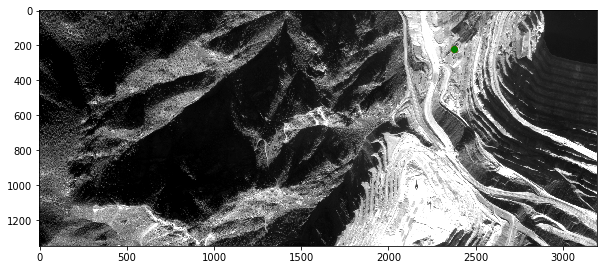

 ----> Real 2D loc in im 53  (yellow) =  [2087.59765625  534.37359619]
 ----> Proj 2D loc in im 53  before BA (red) =  [2085.51022603  534.45211281]
 ----> Proj 2D loc in im 53  after  BA (green) =  [2086.74796369  534.40531673]
              Reprojection error beofre BA: 2.165946838517357
              Reprojection error after  BA: 0.8814130978977346


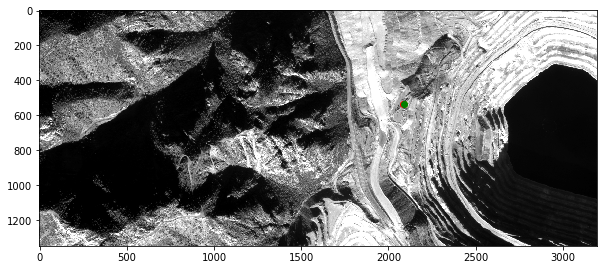

Mean reprojection error before BA: 1.8730727005784757
Mean reprojection error after BA: 0.7619021414027287


In [8]:
scene.ba_pipeline.visualize_feature_track()

image 1, mean abs reproj error before BA: 0.6949
image 1, mean abs reproj error after  BA: 0.3921


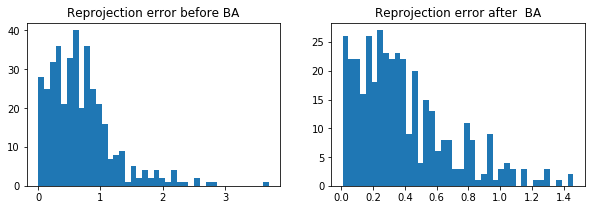

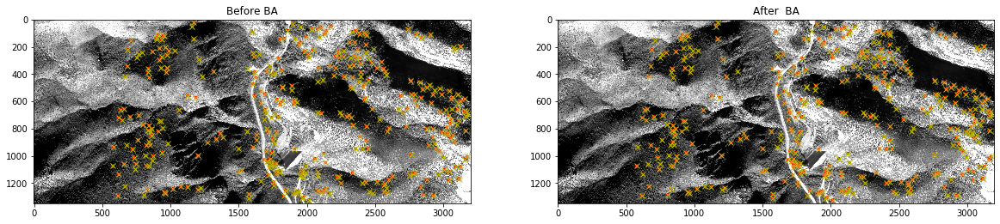

In [9]:
scene.ba_pipeline.analyse_reproj_err_particular_image(1, plot=True)


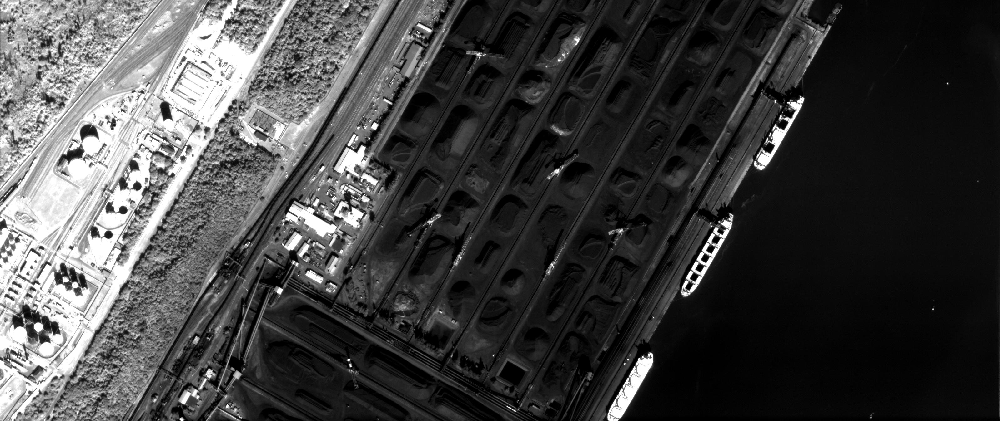
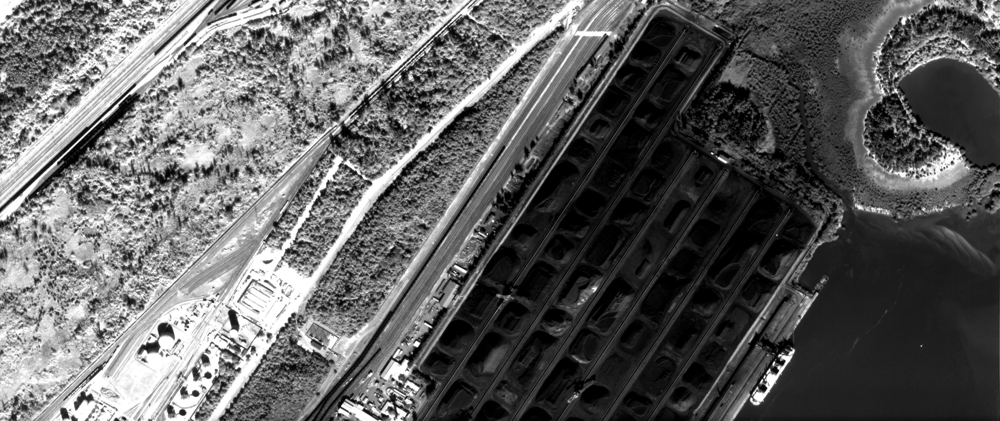
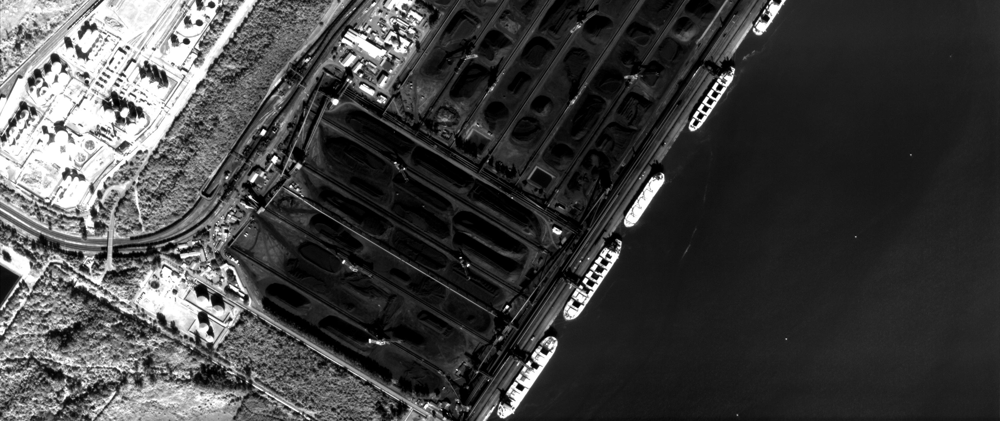
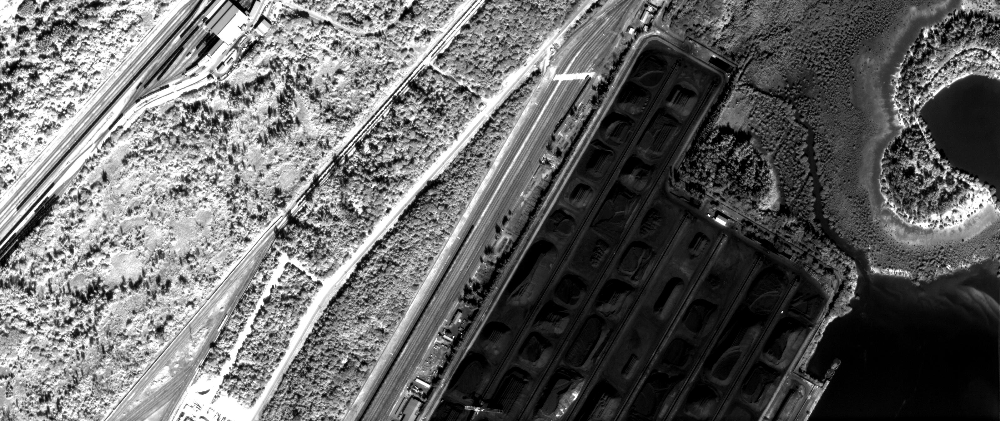

In [104]:
scene.display_crops()

Found 3000 keypoints in image 0 and 3000 keypoints in image 1


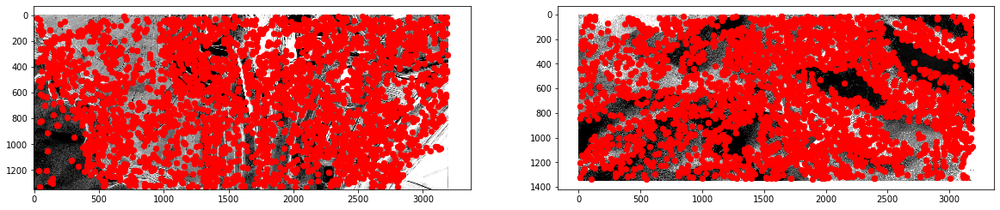

In [10]:
from feature_tracks import ft_utils

ft_utils.plot_features_stereo_pair(0, 1, scene.ba_pipeline.features, scene.ba_pipeline.input_seq)

0 pairwise matches to display for pair (1,3)


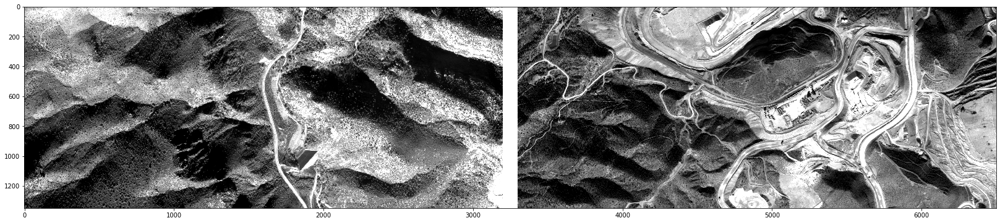

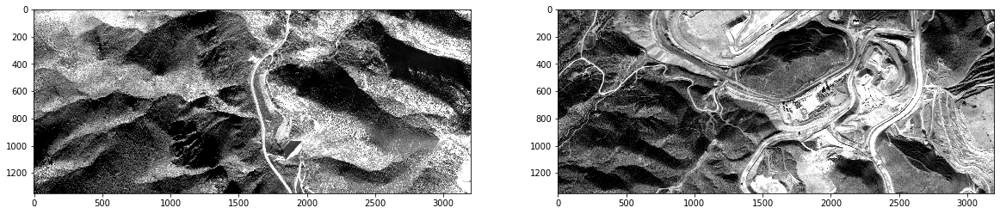

In [11]:
from feature_tracks import ft_utils

ft_utils.plot_pairwise_matches_stereo_pair(1, 3, scene.ba_pipeline.features,
                                           scene.ba_pipeline.pairwise_matches, scene.ba_pipeline.input_seq)

0 track observations to display for pair (0,1)
List of track indices: []


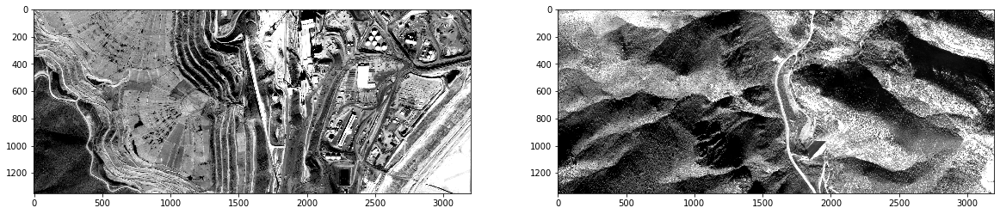

In [12]:
from feature_tracks import ft_utils

ft_utils.plot_track_observations_stereo_pair(0, 1, scene.ba_pipeline.C,  scene.ba_pipeline.input_seq)

----- CONNECTIVITY GRAPH: 172 edges


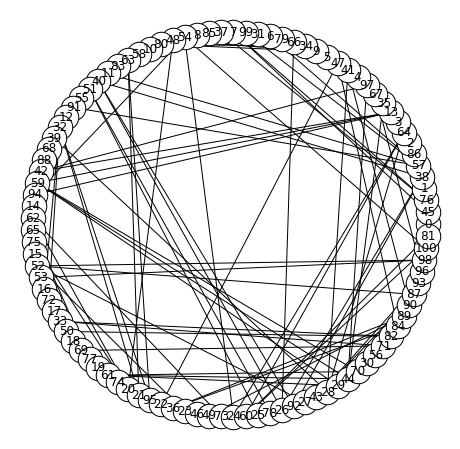

----- CONNECTIVITY GRAPH: 111 edges
Attention! Graph G contains 12 connected components


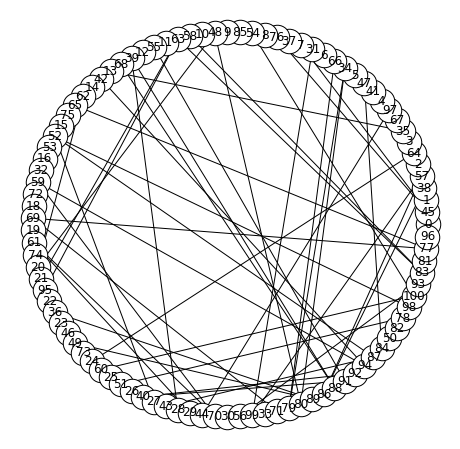

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0., 12.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  8.,  0.],
       [ 0., 12.,  0., ...,  8.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [34]:
from bundle_adjust import ba_utils

ba_utils.plot_connectivity_graph(scene.ba_pipeline.C, 50, save_pgf=False)

ba_utils.plot_connectivity_graph(scene.ba_pipeline.C, 100, save_pgf=False)


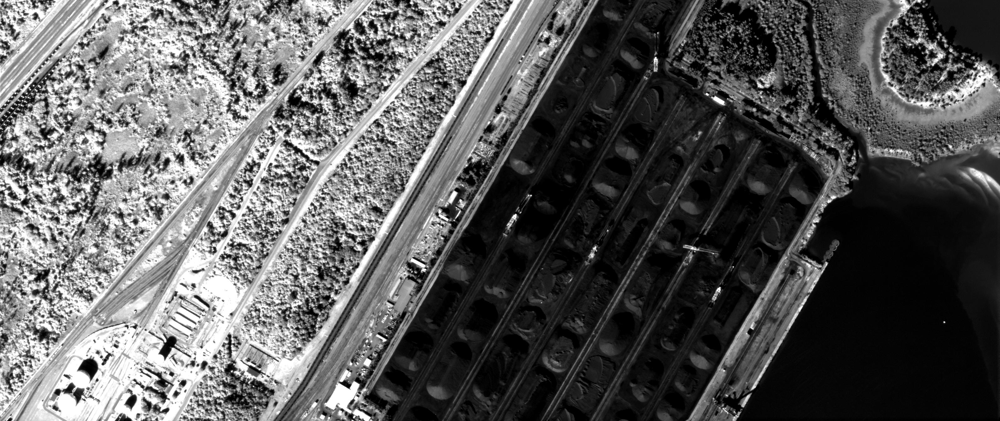
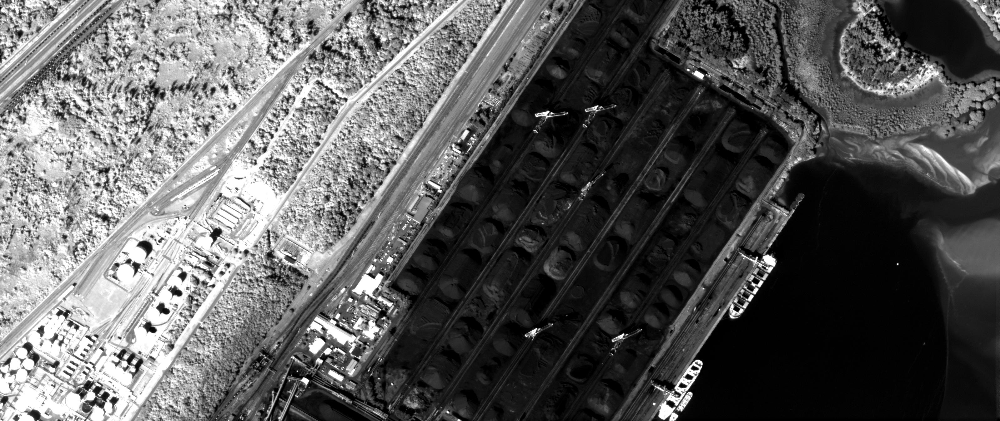
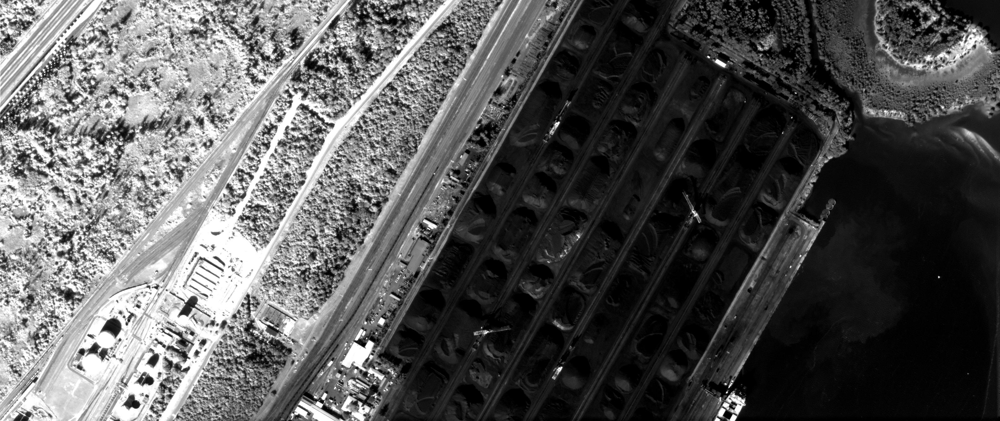
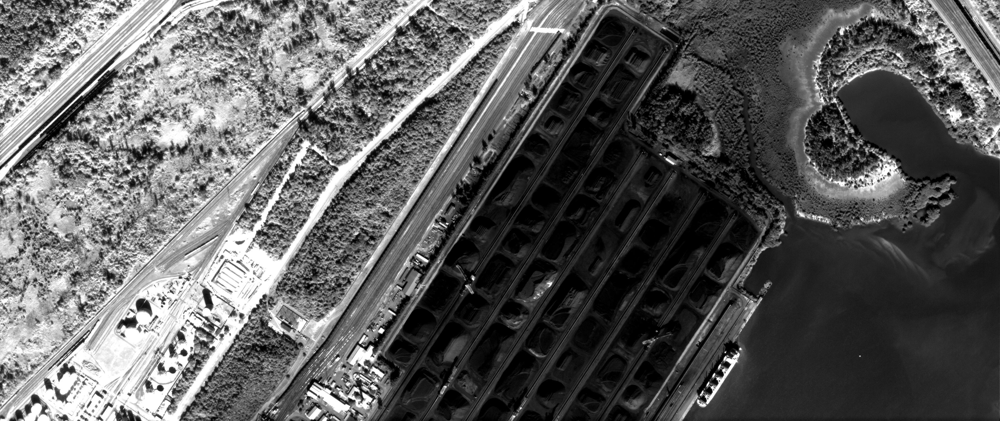
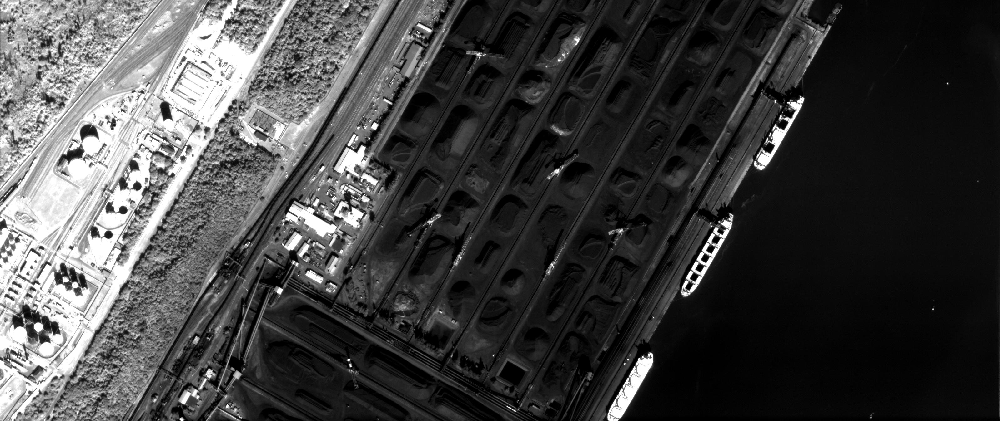

In [20]:
scene.display_crops()

In [43]:
scene.ba_pipeline.save_feature_tracks_as_svg(scene.dst_dir)


SIFT keypoints were saved at exp/mine_L1B/sift


Feature tracks and their reprojection were saved at exp/mine_L1B



# Reconstruct scene

### Compute s2p DSMs with corrected RPCss

In [ ]:
ba_method = 'ba_global'
s
for t_idx in timeline_indices:s
    scene.reconstruct_date(t_idx, ba_method)

In [36]:
for t_idx in timeline_indices:
    scene.compute_std_per_date(t_idx, ba_method)


###################################################################################
Computing std for specific date...
  - complete_dsm_fname: exp/mine/ba_global/4D/dsms/20190128_204710.tif
  - tile_size: 500
###################################################################################


Clipping dsms...

Done!

261 tiles / 616
Done!



In [19]:
scene.compute_3D_statistics_over_time(timeline_indices, ba_method)


Computing 4D statistics of the timeseries! Chosen dates:
2019-06-08 07:53:52
2019-06-17 07:51:38
2019-06-27 07:48:21
2019-06-29 10:47:31
2019-06-30 10:44:24

Done! Results were saved at exp/RB_ZAF_0001/4D_ba_out-of-core/4Dstats
